<a href="https://colab.research.google.com/github/moienr/LST-SigleChannel-SplitWindow/blob/main/LSE_LST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# LSE and LST Calculation - Class of Thermal Remote Sensing - `Dr. Kiavarz`
by: `Moien Rangzan` moienrangzan@gmail.com

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.3 MB 431 kB/s 


In [ ]:
import rasterio as rio
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
import os
import plotly.express as px # for interactive plots and inspecting the pixel values.
from collections import namedtuple

px_width = 562
px_height = 372

In [ ]:
if not (os.path.exists("/content/sr_subset.tif")):
  !unzip '/content/drive/MyDrive/Colab Notebooks/LST/shoushtar_subset.zip'
else:
  print('aleady unziped!')

Archive:  /content/drive/MyDrive/Colab Notebooks/LST/shoushtar_subset.zip
  inflating: sr_subset.tif           
  inflating: tir_brt.tif             
  inflating: tir_radiance.tif        
  inflating: tir_subset.tif          


# Visualizing the data
our data is landsat 8 Collection 2 Level 1


## Surface reflectance
this SR data was drived in ENVI - using QUAC atmospheric correction.
it is band 1 to 7, which band 1 is Areosel and we dont need it.
so we take `band 2-7` (1-6 python index)

https://www.youtube.com/watch?v=GKgpvriuQY8

In [ ]:
sr = rio.open("/content/sr_subset.tif")

In [ ]:
sr =sr.read()
sr.shape

(7, 1009, 1520)

I've recently found out about `namedTuples` so I am using them here as a chance to practis

In [ ]:
SR = namedtuple('SR' , ['b1','b2','b3','b4','b5','b6','b7'])

In [ ]:
sr = SR(sr[0],sr[1],sr[2],sr[3],sr[4],sr[5],sr[6])

In [ ]:
print(np.min(sr),np.mean(sr),np.max(sr))

0.0224 0.23927277 2.6


In [ ]:
plt.rcParams['figure.figsize'] = [30,10]

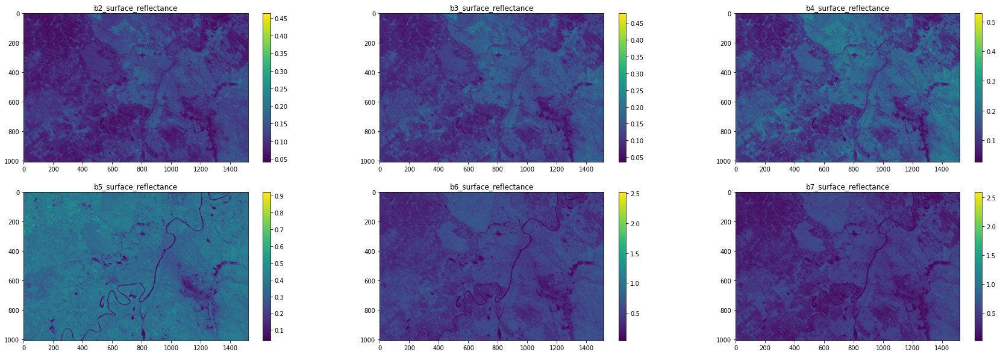

In [ ]:
fig, ax = plt.subplots(2, 3)
k = 1 # we do not need band 1
for i in range(2):
    for j in range(3):

         im = ax[i, j].imshow(sr[k])
         ax[i, j].set_title('b' + str(k+1) + '_surface_reflectance')
         plt.colorbar(im, ax=ax[i, j])
         k += 1
plt.show()

### Wrong SRs for band 6 and 7
this is a common error which a few pixels get values more that 1, to correct this we set these values to 1.0

In [ ]:
plt.rcParams['figure.figsize'] = [10,5]

(array([[373., 551.,  85., ...,   0.,   0.,   0.],
        [379., 561.,  69., ...,   0.,   0.,   0.],
        [376., 566.,  67., ...,   0.,   0.,   0.],
        ...,
        [160., 437., 412., ...,   0.,   0.,   0.],
        [161., 423., 425., ...,   0.,   0.,   0.],
        [156., 415., 438., ...,   0.,   0.,   0.]]),
 array([0.0224    , 0.28015998, 0.53792   , 0.79568   , 1.05344   ,
        1.3111999 , 1.56896   , 1.8267199 , 2.0844798 , 2.3422399 ,
        2.6       ], dtype=float32),
 <a list of 1520 Lists of Patches objects>)

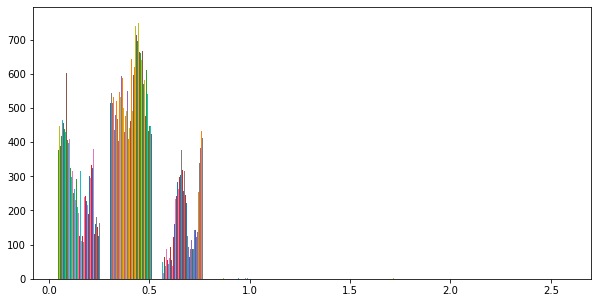

In [ ]:
plt.hist(sr.b7)

In [ ]:
sr.b6[sr.b6>=1] = 0.99
sr.b7[sr.b7>=1] = 0.99

### Visualization

this is fucntion to both stack bands as rgb adn stretch the histogram if needed


In [ ]:
def stack_3_channel(r,g,b , clipLimit = 20 ,  tileGridSize=(16,16) ):


  # r = (r/np.max(r))*255
  # g = (g/np.max(g))*255
  # b = (b/np.max(b))*255

  img = np.stack([r,g,b], axis=2)
  img = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

  hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
  h, s, v = hsv_img[:,:,0], hsv_img[:,:,1], hsv_img[:,:,2]



  clahe = cv.createCLAHE(clipLimit, tileGridSize)
  v = clahe.apply(v) #stretched histogram for showing the image with better contrast - its not ok to use it for scientific calculations

  hsv_img = np.dstack((h,s,v))

  # NOTE: HSV2RGB returns BGR instead of RGB
  bgr_stretched = cv.cvtColor(hsv_img, cv.COLOR_HSV2RGB)

  #reversing the bands back to RGB
  rgb_stretched = np.zeros(bgr_stretched.shape)
  rgb_stretched[:,:,0] = bgr_stretched[:,:,2]
  rgb_stretched[:,:,1] = bgr_stretched[:,:,1]
  rgb_stretched[:,:,2] = bgr_stretched[:,:,0]

  # if the valuse are float, plt will have problem showing them
  rgb_stretched = rgb_stretched.astype('uint8')

  return img , rgb_stretched

In [ ]:
plt.rcParams['figure.figsize'] = [30,7]

(1009, 1520, 3)
(1009, 1520, 3)


Text(0.5, 1.0, 'False Color Composite')

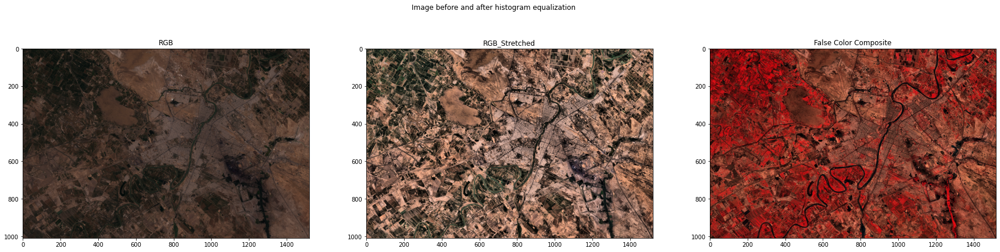

In [ ]:
rgb , stretched = stack_3_channel(sr.b4,sr.b3,sr.b2,clipLimit = 5 ,  tileGridSize=(16,16) )
print(stretched.shape)

fcc , fcc_stretched = stack_3_channel(sr.b5,sr.b4,sr.b3,clipLimit = 5 ,  tileGridSize=(16,16) )
print(stretched.shape)

fig, (ax1, ax2,ax3) = plt.subplots(1, 3)
fig.suptitle('Image before and after histogram equalization')
ax1.imshow(rgb)
ax2.imshow(stretched)
ax3.imshow(fcc_stretched)

ax1.set_title('RGB')
ax2.set_title('RGB_Stretched')
ax3.set_title('False Color Composite')

## Thermal bands

the radiance and brightness temprature was calculate in ENVI, Could have been calculated here, but I didn't so the code won't get messy.

In [ ]:
tir = rio.open("/content/tir_subset.tif")
tir = tir.read()

tir_rad = rio.open("/content/tir_radiance.tif")
tir_rad = tir_rad.read()

tir_brt = rio.open("/content/tir_brt.tif")
tir_brt = tir_brt.read()

print(tir.shape,tir_rad.shape,tir_brt.shape)

(2, 1009, 1520) (2, 1009, 1520) (2, 1009, 1520)


In [ ]:
plt.rcParams['figure.figsize'] = [30,10]

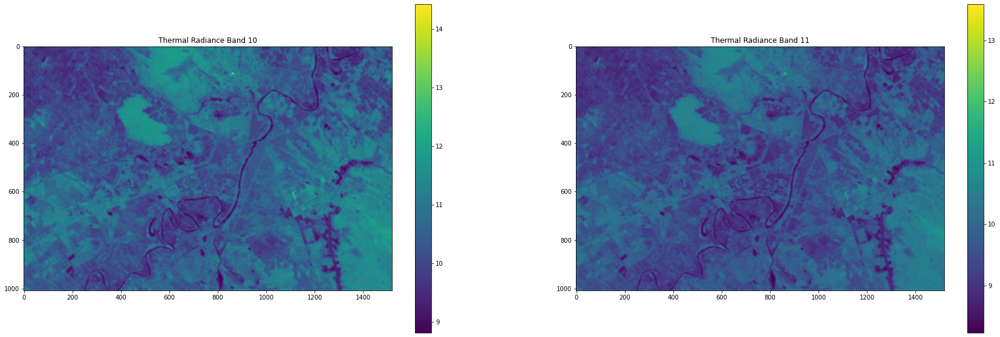

In [ ]:
fig, ax = plt.subplots(1, 2)

im = ax[0].imshow(tir_rad[0])
ax[0].set_title('Thermal Radiance Band 10')
plt.colorbar(im, ax=ax[0])

im = ax[1].imshow(tir_rad[1])
ax[1].set_title('Thermal Radiance Band 11')
plt.colorbar(im, ax=ax[1])


plt.show()

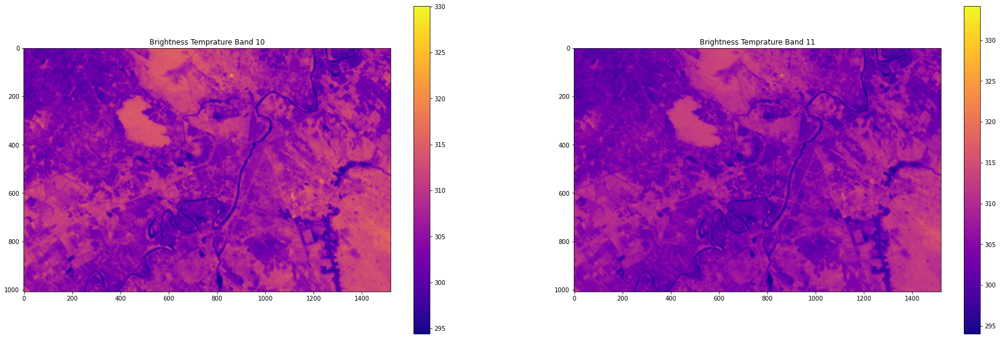

In [ ]:
fig, ax = plt.subplots(1, 2)

im = ax[0].imshow(tir_brt[0],cmap='plasma')
ax[0].set_title('Brightness Temprature Band 10')
plt.colorbar(im, ax=ax[0])

im = ax[1].imshow(tir_brt[1],cmap='plasma')
ax[1].set_title('Brightness Temprature Band 11')
plt.colorbar(im, ax=ax[1])


plt.show()

# Emisstivity

## NDVI and FVC

as mentioned in vidoes we set the `Dry Soil NDVI as 0.15` and `Full Vegetation NDVI as 0.6`


In [ ]:
NDVIs = 0.15
NDVIv = 0.6

In [ ]:
def ndvi_calculator(red,nir):
  ndvi = (nir-red)/(nir+red)
  return ndvi

In [ ]:
def fvc_calculator(ndvi,NDVIs = 0.15,NDVIv = 0.6):
  fvc = ((ndvi-NDVIs)/(NDVIv-NDVIs))**2
  return fvc

In [ ]:
ndvi  = ndvi_calculator(sr.b4,sr.b5)

In [ ]:
fvc = fvc_calculator(ndvi)

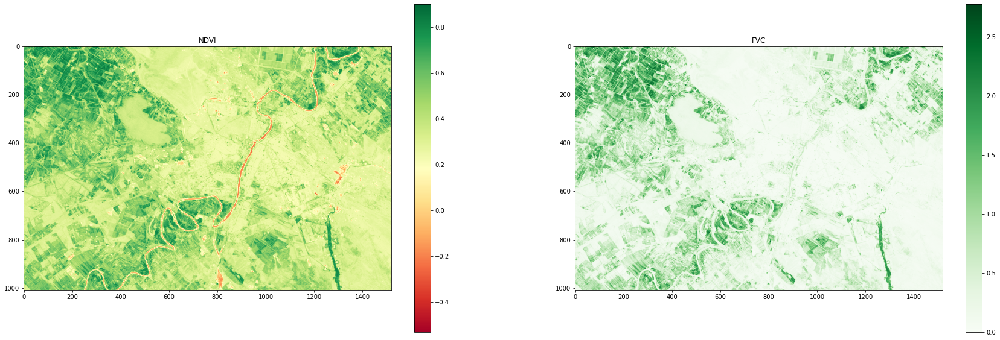

In [ ]:
fig, ax = plt.subplots(1, 2)

im = ax[0].imshow(ndvi,cmap='RdYlGn')
ax[0].set_title('NDVI')
plt.colorbar(im, ax=ax[0])

im = ax[1].imshow(fvc,cmap='Greens')
ax[1].set_title('FVC')
plt.colorbar(im, ax=ax[1])


plt.show()

In [ ]:
fvc_zero_map = np.ones(fvc.shape)
fvc_zero_map[fvc<0.001] = 0

NOTE: we dont have a single value with `fvc=0`

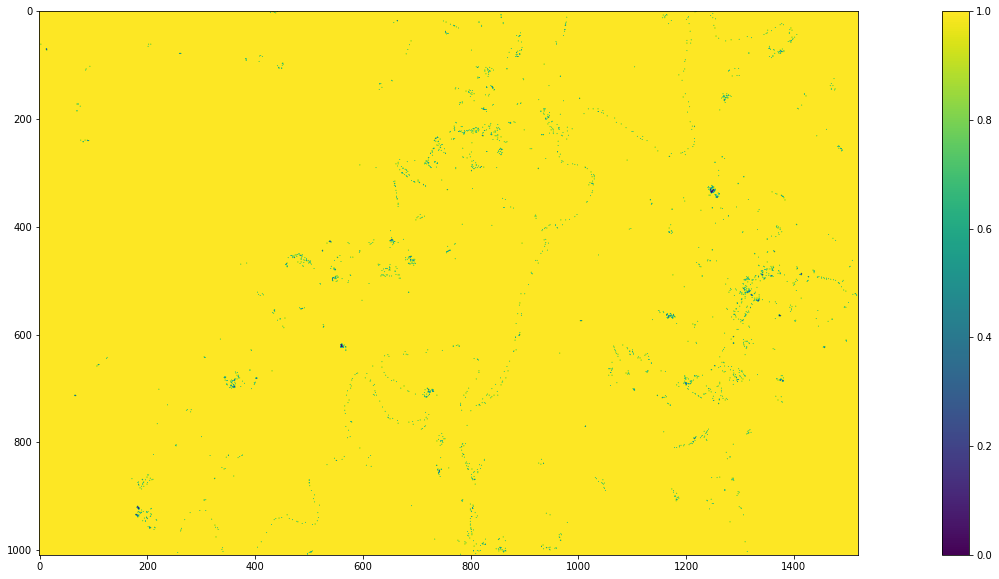

In [ ]:
plt.imshow(fvc_zero_map)
plt.colorbar()

## Emisstivity for band 10

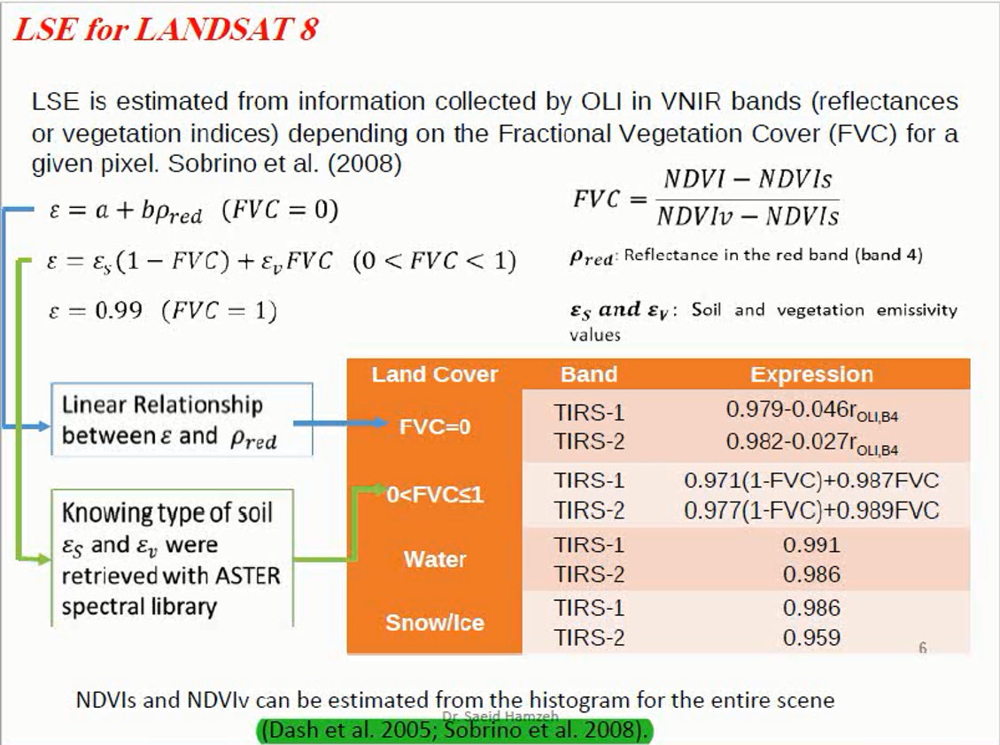

### numpy logical equaling
when your are using condition in a matrix to change valuse with another mothrix with the same size you `have to` put the same condition for other matrix

```
x[x>2] = y[x>2]

or
# z is another matrix with the same size
x[z>2] = y[z>2]

```

In [ ]:
e10 = np.zeros(sr[0].shape)
e10[ndvi<0] = 0.991
e10[np.logical_and(ndvi>=0,ndvi<NDVIs)] = (0.979 - 0.046 * sr.b4)[np.logical_and(ndvi>=0,ndvi<NDVIs)]
e10[np.logical_and(ndvi>=NDVIs,ndvi<NDVIv)] = (0.987*fvc + 0.971*(1-fvc))[np.logical_and(ndvi>=NDVIs,ndvi<NDVIv)]
e10[ndvi>=NDVIv] = 0.99

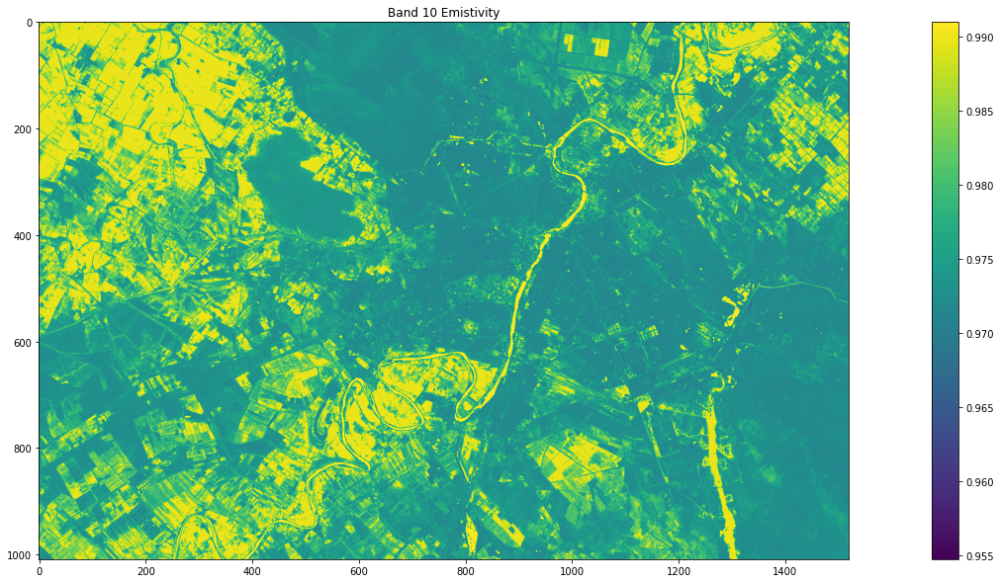

In [ ]:
plt.imshow(e10)
plt.title('Band 10 Emistivity')
plt.colorbar()

In [ ]:
e11 = np.zeros(sr[0].shape)
e11[ndvi<0] = 0.986
e11[np.logical_and(ndvi>=0,ndvi<NDVIs)] = (0.982 - 0.027 * sr.b4)[np.logical_and(ndvi>=0,ndvi<NDVIs)]
e11[np.logical_and(ndvi>=NDVIs,ndvi<NDVIv)] = (0.989*fvc + 0.977*(1-fvc))[np.logical_and(ndvi>=NDVIs,ndvi<NDVIv)]
e11[ndvi>=NDVIv] = 0.99

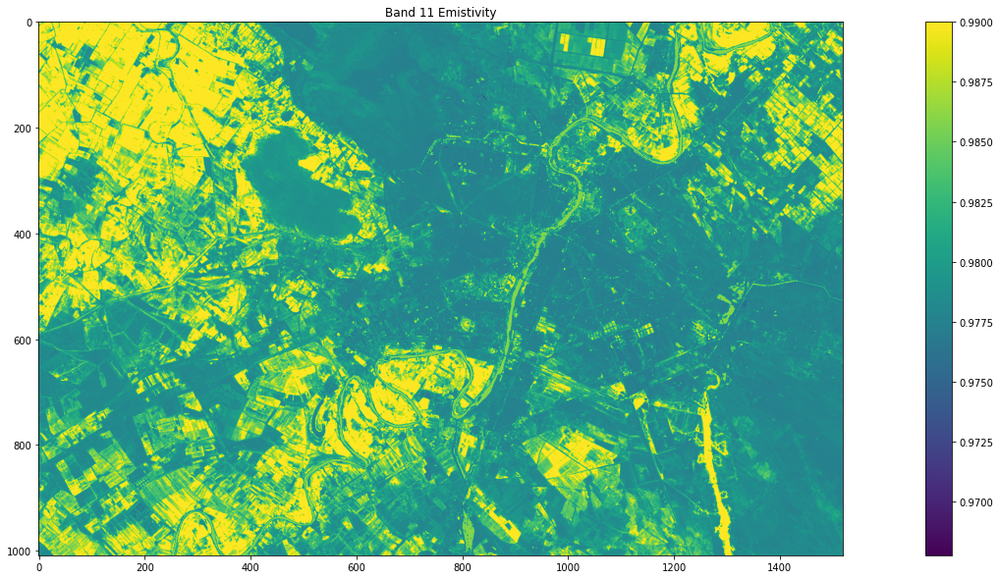

In [ ]:
plt.imshow(e11)
plt.title('Band 11 Emistivity')
plt.colorbar()

In [ ]:
emist_mean = (e10 + e11)/2
emist_diff = e11 - e10

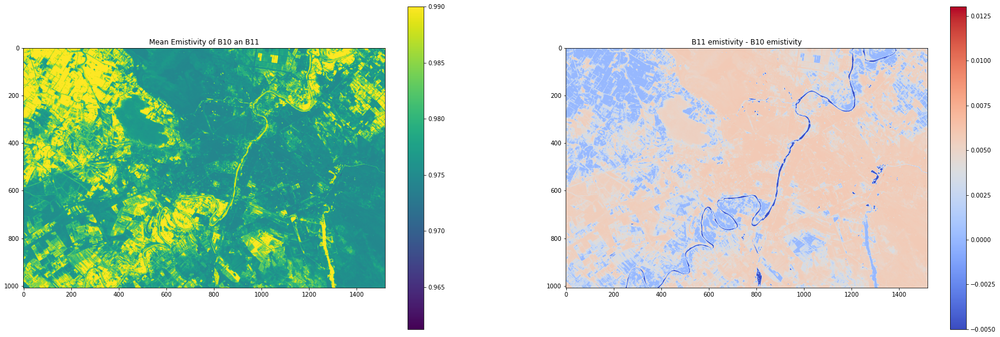

In [ ]:
fig, ax = plt.subplots(1, 2)

im = ax[0].imshow(emist_mean)
ax[0].set_title('Mean Emistivity of B10 an B11')
plt.colorbar(im, ax=ax[0])

im = ax[1].imshow(emist_diff,cmap='coolwarm')
ax[1].set_title('B11 emistivity - B10 emistivity')
plt.colorbar(im, ax=ax[1])


plt.show()

# Split-Window LST

## Split-Window Constants

In [ ]:
c0 = -0.268
c1 = 1.378
c2 = 0.183
c3 = 54.30
c4 = -2.238
c5 = -129.20
c6 = 16.40

## water vapor
I chose this from the video but, I have to get `MODIS07` product to get the exact value.

In [ ]:
watervapor = 0.5

In [ ]:
bt10 = tir_brt[0]
bt11 = tir_brt[1]

## Final LST

In [ ]:
 SW_T = bt10 + c1 *(bt10-bt11) + c2*((bt10-bt11)**2) + c0 + (c3 + c4*watervapor) *(1-emist_mean) + (c5+c6*watervapor) * emist_diff

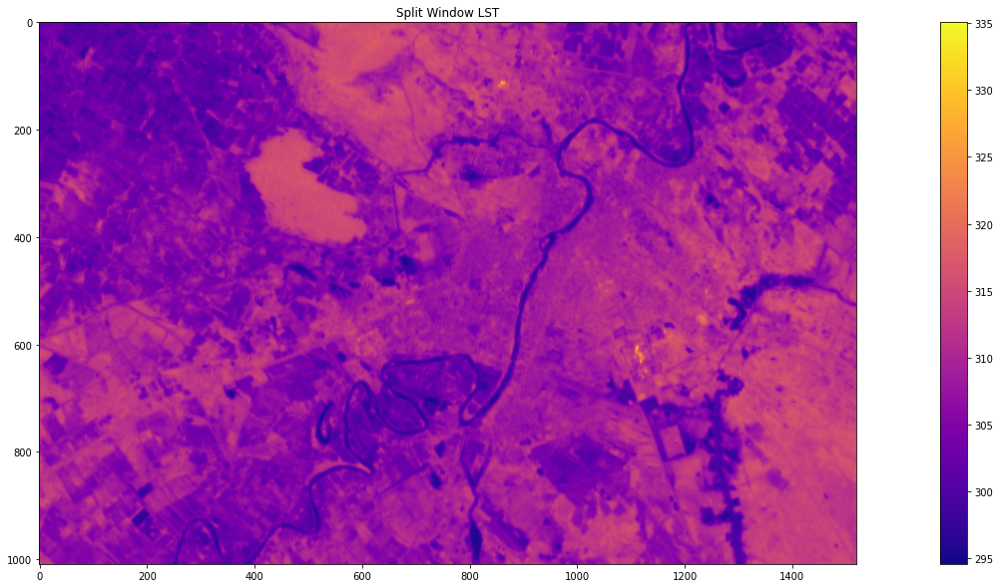

In [ ]:
plt.imshow(SW_T,cmap='plasma')
plt.title('Split Window LST')
plt.colorbar()
plt.show()

In [ ]:
# fig = px.imshow(SW_T)
# fig.update_layout(
#     autosize=False,
#     width=px_width,
#     height=px_height,
#     margin=dict(
#         l=10,
#         r=10,
#         b=10,
#         t=10,
#         pad=4
#     )
# )

# fig.update_layout(
#     title={
#         'text': "Split-Window LST",
#         'y':0.95,
#         'x':0.5,
#         'xanchor': 'center',
#         'yanchor': 'top'})
# fig.show()

# Single Channel LST

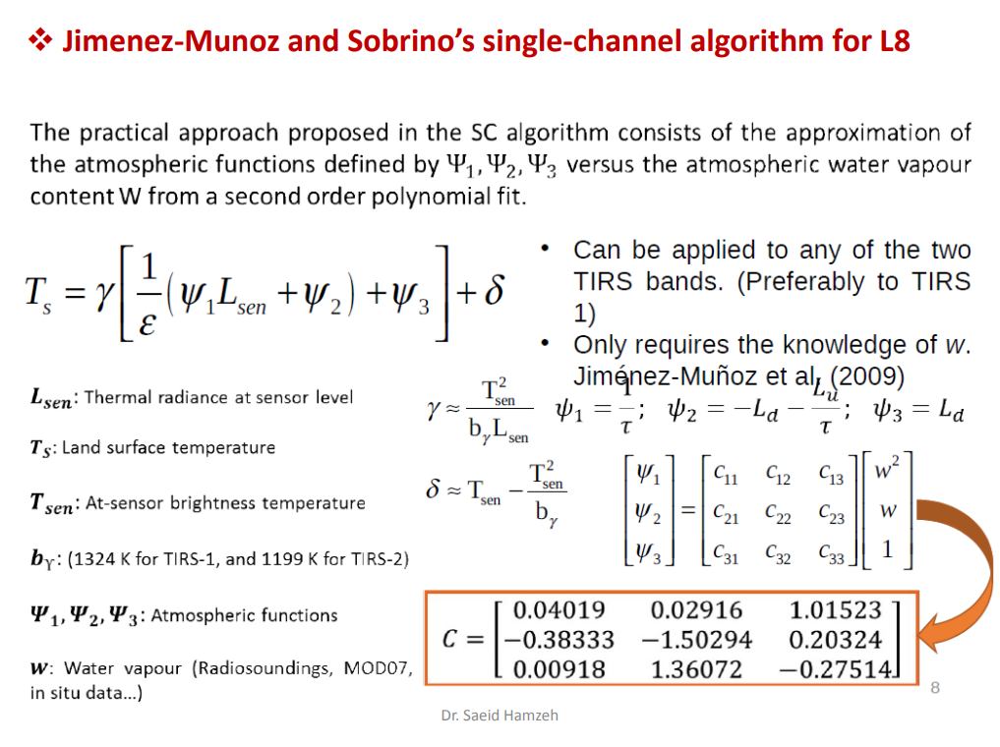

In [ ]:
sai = np.zeros((3,1))

In [ ]:
C = np.array([[0.04019,0.02916,1.01523],
              [-0.38333,-1.50294,0.20324],
              [0.00918,1.36072,-0.27514]])

In [ ]:
W = np.array([watervapor**2,watervapor,1])

In [ ]:
W.reshape(3,1)

array([[0.25],
       [0.5 ],
       [1.  ]])

In [ ]:
sai = np.dot(C,W)

In [ ]:
print(sai)

[ 1.0398575 -0.6440625  0.407515 ]


In [ ]:
rad10 = tir_rad[0]
rad11 = tir_rad[1]

In [ ]:
gamma = bt10**2/(1324*rad10)
sigma = bt10 - (bt10**2/1324)

In [ ]:
SC_T = ((sai[0]*rad10 + sai[1])/e10) + sai[2]
SC_T = gamma*SC_T + sigma

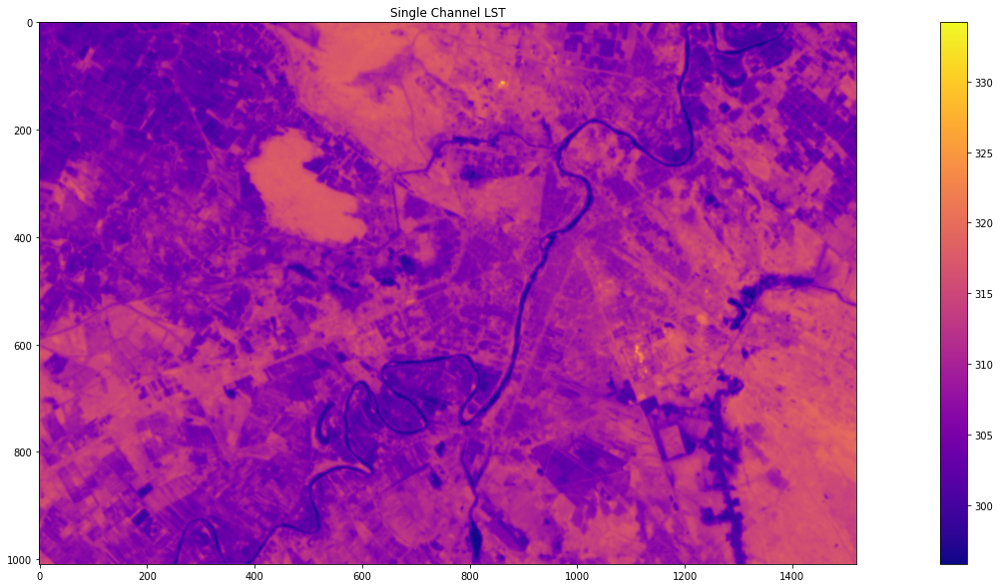

In [ ]:
plt.imshow(SC_T,cmap='plasma')
plt.title('Single Channel LST')
plt.colorbar()
plt.show()

In [ ]:
# fig = px.imshow(SC_T)
# fig.update_layout(
#     autosize=False,
#     width=px_width,
#     height=px_height,
#     margin=dict(
#         l=10,
#         r=10,
#         b=10,
#         t=10,
#         pad=4
#     )
# )
# fig.update_layout(
#     title={
#         'text': "Single Channel LST",
#         'y':0.95,
#         'x':0.5,
#         'xanchor': 'center',
#         'yanchor': 'top'})
# fig.show()

# Diffrence Between Split-window and Single-Channel

as you can see in the `Suberb Area` Single-chanle has higher values `blue` and in the `urnban areas` Split Window has higher values `red`

In [ ]:
lst_diff = SW_T - SC_T

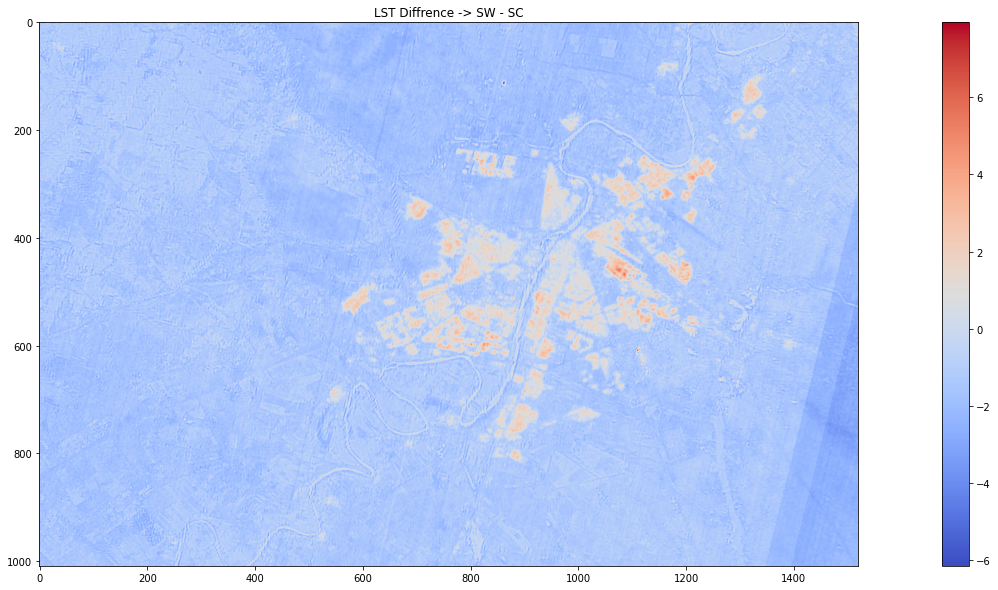

In [ ]:
plt.imshow(lst_diff,cmap='coolwarm')
plt.title('LST Diffrence -> SW - SC')
plt.colorbar()
plt.show()

(array([[  0.,   0., 141., ...,   0.,   0.,   0.],
        [  0.,   0., 136., ...,   0.,   0.,   0.],
        [  0.,   0., 122., ...,   0.,   0.,   0.],
        ...,
        [  0.,   2., 671., ...,   0.,   0.,   0.],
        [  0.,   4., 673., ...,   0.,   0.,   0.],
        [  0.,   9., 666., ...,   0.,   0.,   0.]]),
 array([-6.15113852, -4.74120589, -3.33127326, -1.92134064, -0.51140801,
         0.89852462,  2.30845725,  3.71838988,  5.12832251,  6.53825514,
         7.94818777]),
 <a list of 1520 Lists of Patches objects>)

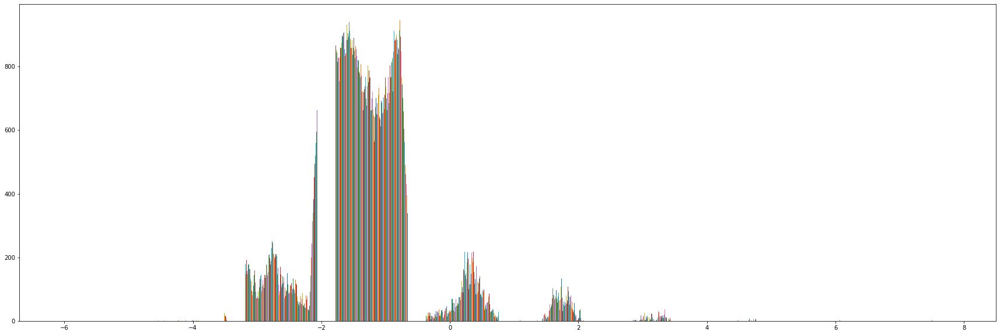

In [ ]:
plt.hist(lst_diff)

# Mono-Window LST

"An Improved Mono-Window Algorithm for Land Surface
Temperature Retrieval from Landsat 8 Thermal Infrared
Sensor Data "
Fei Wang 1,2, Zhihao Qin 1,*, Caiying Song 1,2, Lili Tu 1,2, Arnon Karnieli 3 and Shuhe Zhao 2,4,*

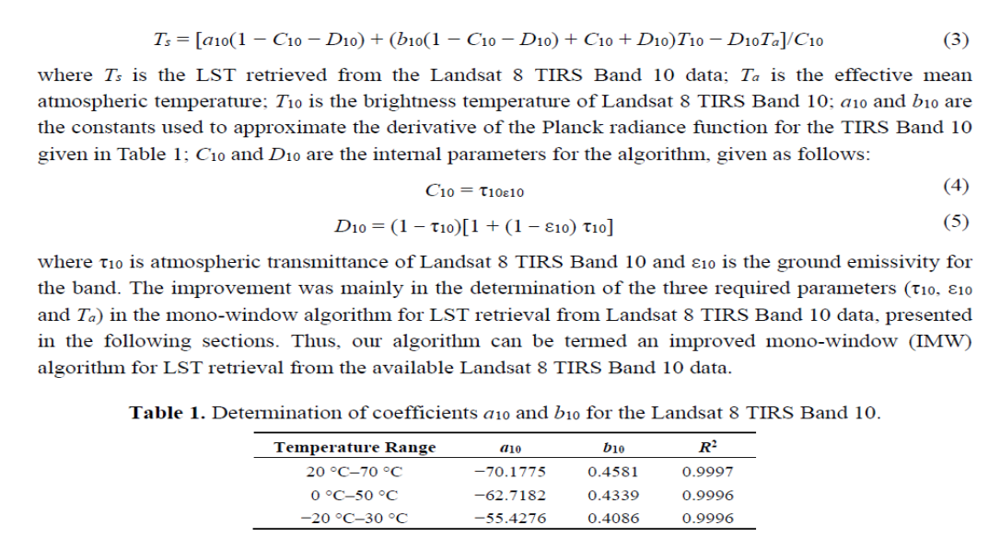

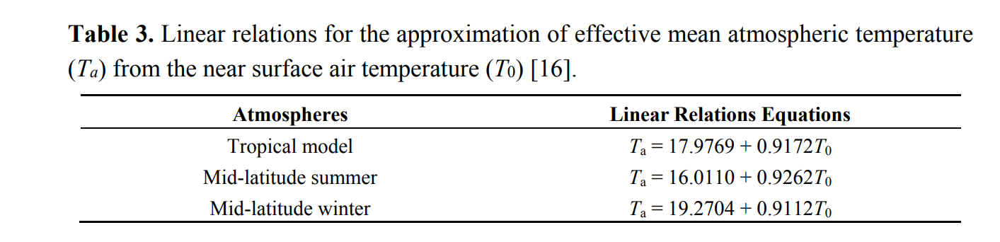

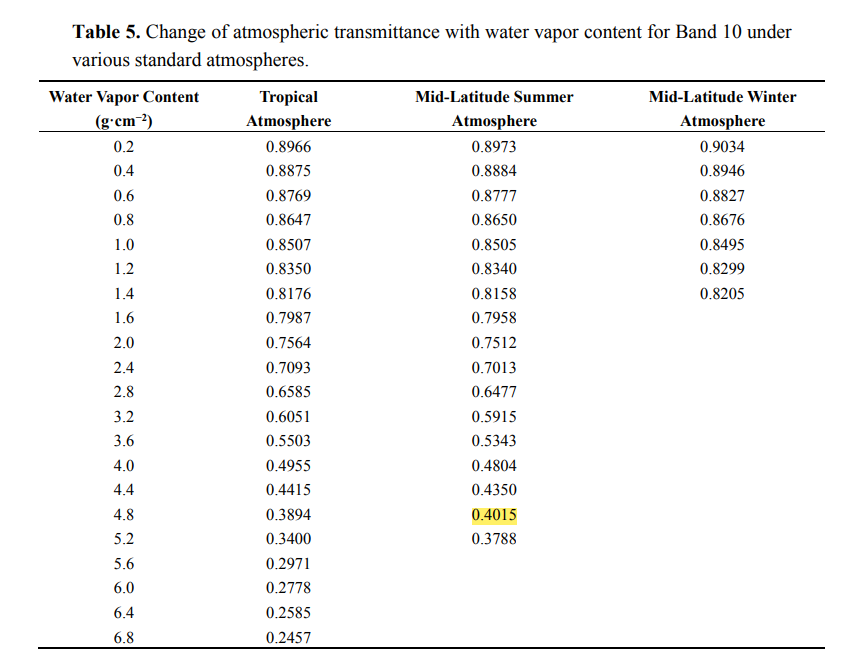

In [ ]:
taw10 = 0.4015
a10 = -70.1775
b10 = 0.4581
c10 = taw10 * e10
d10 = (1-taw10) *(1 + (1-e10)*taw10)

Since I Dont have Ground data, we `asume` the `T0 to be 320`

In [ ]:
T0 = 320
Ta = 16.0110 + 0.9262 * T0

In [ ]:
MW_T = (a10*(1-c10-d10) + (b10*(1-c10-d10)+c10+d10)*bt10 - d10* Ta) / c10

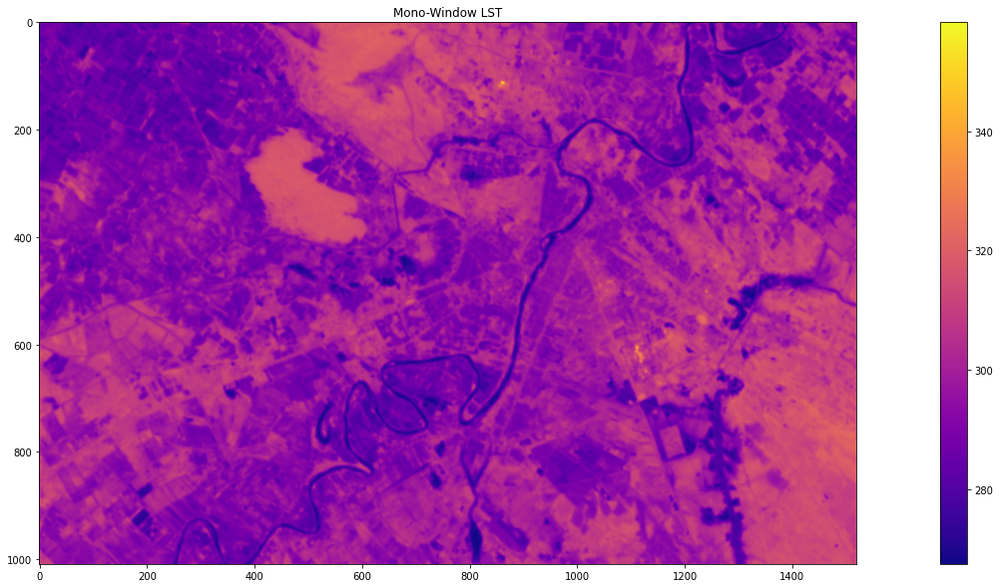

In [ ]:
plt.imshow(MW_T,cmap='plasma')
plt.title('Mono-Window LST')
plt.colorbar()
plt.show()

# Diffrence Between Split_window and Mono_window

Since Mono Window heavily depend on Ground Data, and I Didn't use any, The reauslts are way off

In [ ]:
SW_MW_diff = SW_T - MW_T

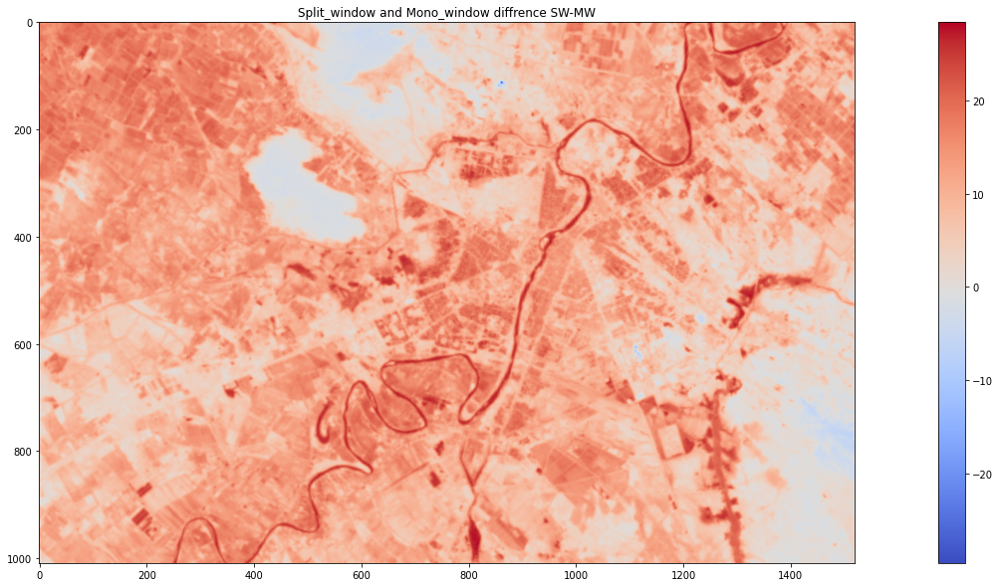

In [ ]:
plt.imshow(SW_MW_diff,cmap='coolwarm')
plt.title('Split_window and Mono_window diffrence SW-MW')
plt.colorbar()
plt.show()

(array([[  0.,   0.,   0., ..., 236., 194.,   0.],
        [  0.,   0.,   0., ..., 248., 195.,   0.],
        [  0.,   0.,   0., ..., 252., 194.,   0.],
        ...,
        [  0.,   0.,   0., ..., 193.,  70.,   0.],
        [  0.,   0.,   0., ..., 193.,  68.,   0.],
        [  0.,   0.,   0., ..., 184.,  70.,   0.]]),
 array([-29.63473808, -23.83045708, -18.02617609, -12.22189509,
         -6.41761409,  -0.6133331 ,   5.1909479 ,  10.99522889,
         16.79950989,  22.60379089,  28.40807188]),
 <a list of 1520 Lists of Patches objects>)

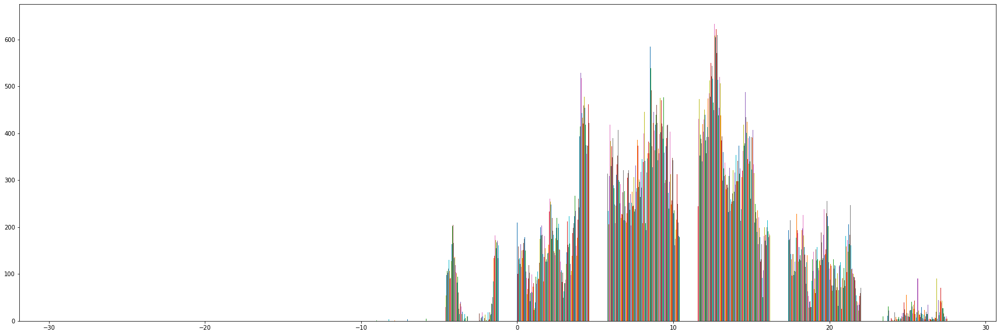

In [ ]:
plt.hist(SW_MW_diff)

# SUHI

## Longitudinal profile
for th rest of this work we use `Split Window LST`

for the `longitudinal profile` we choose `400`th row of lst image

In [ ]:
#lp stands for longitudinal profile

lp = SW_T[400,:]

In [ ]:
stretched.shape

(1009, 1520, 3)

### important python note on  `plt.margins`
we have to set the margins as `0` so the profile plot exactly match the image

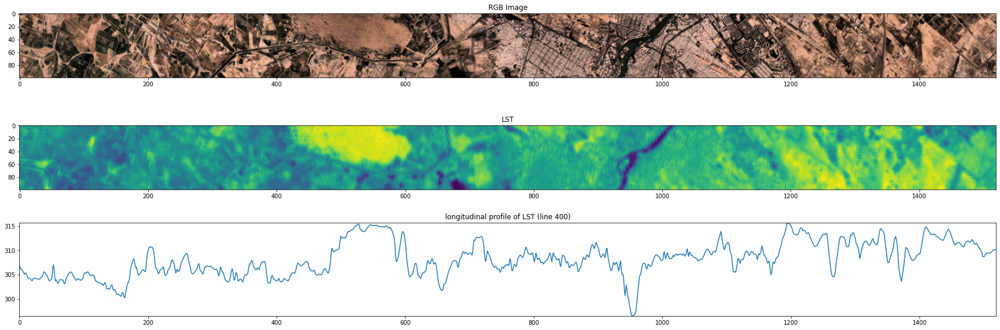

In [ ]:
fig, ax = plt.subplots(3, 1)

im = ax[0].imshow(stretched[350:450,:,:])
ax[0].set_title('RGB Image')

im = ax[1].imshow(SW_T[350:450,:])
ax[1].set_title('LST')


im = ax[2].plot(lp)
ax[2].set_title('longitudinal profile of LST (line 400)')
ax[2].margins(0)

plt.show()

### Concolusion:
I really think I chose a bad date, it is `spring` and it is really hot there in `Khuzestan` at this time, but since `shoushtar` is a `Agricultral` city, the vegetation `inside` and `outside` the city does not differ a lot, so we don't get Urban Heat Island.

But we can see that LST is a lot lower in the `Karoon` River

and also the `highest temprature` is for the big `unvegetated` areas.

From SUHI videos:

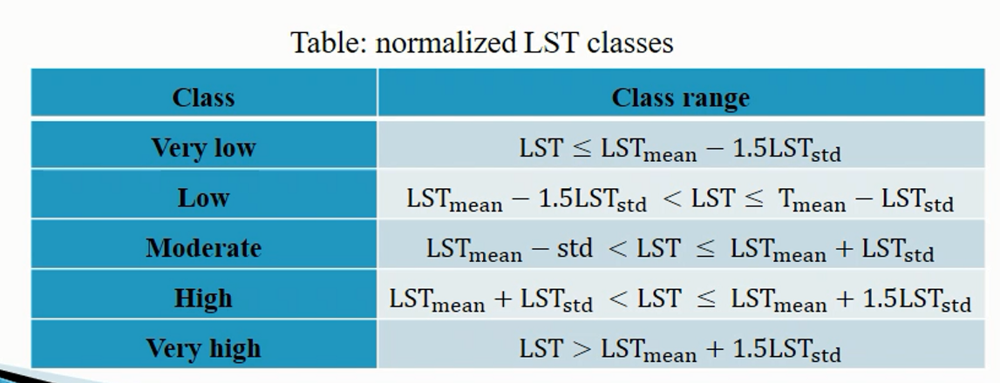

## Classification of the LST

In [ ]:
lst_std = np.std(SW_T)
lst_mean = np.mean(SW_T)

In [ ]:
lst_classified = np.zeros(SW_T.shape)

In [ ]:
lst_classified[SW_T<=lst_mean-(1.5*lst_std)] = 0
lst_classified[np.logical_and(lst_mean-(1.5*lst_std)<SW_T,  SW_T<=lst_mean-lst_std)] = 1
lst_classified[np.logical_and(lst_mean-lst_std<SW_T,SW_T<=lst_mean+lst_std)] = 2
lst_classified[np.logical_and(lst_mean+lst_std<SW_T,SW_T<lst_mean+(1.5*lst_std))] = 3
lst_classified[lst_mean+(1.5*lst_std)<SW_T] = 4

In [ ]:
from pylab import *

In [ ]:
cmap = cm.get_cmap('cividis', 5)    # 11 discrete colors

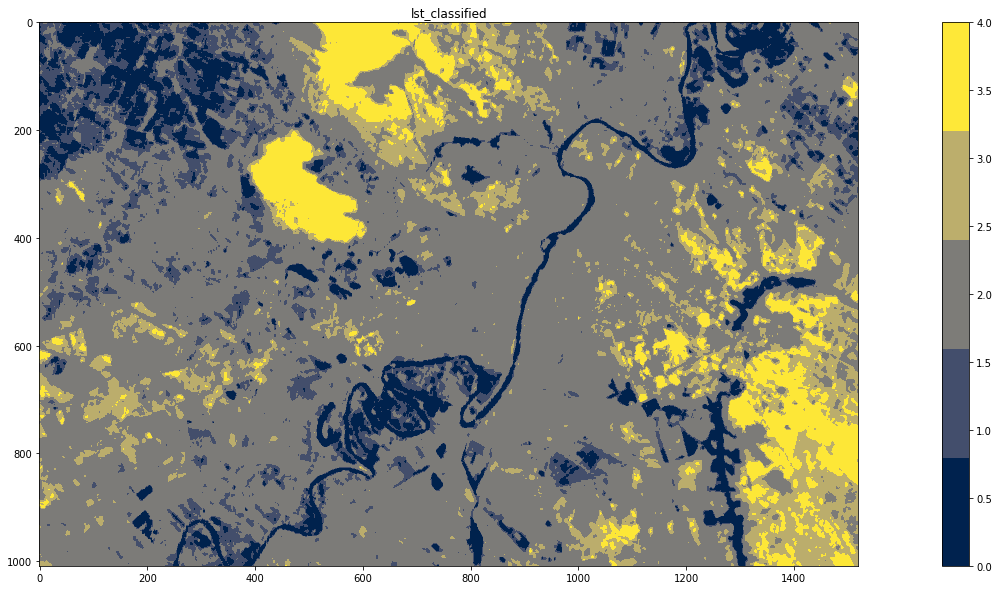

In [ ]:
plt.imshow(lst_classified,cmap=cmap)
plt.title('lst_classified')
plt.colorbar()
plt.show()

As we can see in the above resaults, and as we infered before, In this season the City `Shoushtar` Does not create `Urban Heat Island`